In [19]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import sklearn.datasets
from sklearn.decomposition import PCA, TruncatedSVD

### Nacitaj tvare

In [20]:
_, _, files = list(os.walk("photos64"))[0]

faces = dict()

for f in files:
    f.encode('unicode_escape')
    img = cv2.imread("photos64/"+f)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces[f] = gray


### Nacitanie trenovacieho dataset

In [21]:
images_teachers = np.dstack([f.T for f in faces.values()]).T
images_teachers.shape

(274, 64, 64)

In [22]:
images_oliv = sklearn.datasets.fetch_olivetti_faces()["images"]
images_oliv.shape

(400, 64, 64)

In [23]:
images = np.dstack([c.T for c in list(images_oliv) + list(images_teachers)]).T

In [24]:
images.shape

(674, 64, 64)

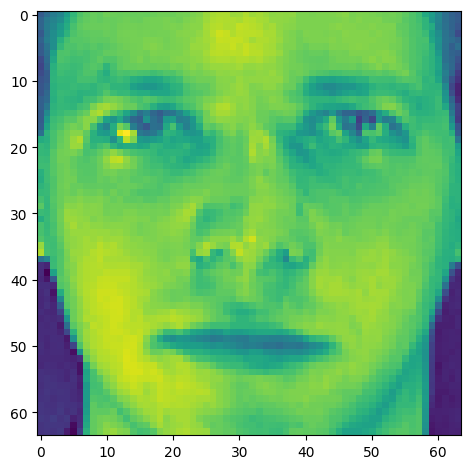

In [40]:
plt.imshow(images[0])

### Priemerna tvar

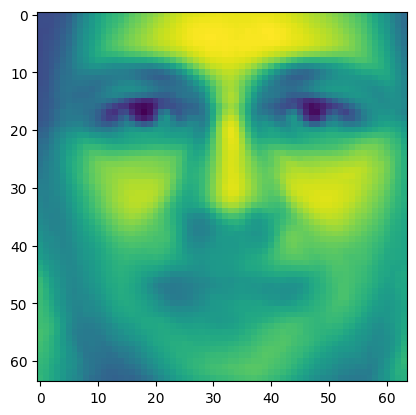

In [26]:
avg_face = np.zeros(64*64)    
for face in images:
    face_vec = face.flatten()
    avg_face += face_vec

avg_face = avg_face/len(images)
avg_face_img = avg_face.reshape(64, 64)
plt.imshow(avg_face_img)

### Rozdielny trenovacich oproti priemernej tvary

In [27]:
face_train_diffs = list()
for face in images:
    face_vec = face.flatten()
    face_train_diffs.append(face_vec - avg_face)

### Vypocitaj eigenfaces

In [28]:
A = np.matrix([i for i in face_train_diffs]).T
U, S, VT = np.linalg.svd(A, full_matrices=0)
U.shape

(4096, 674)

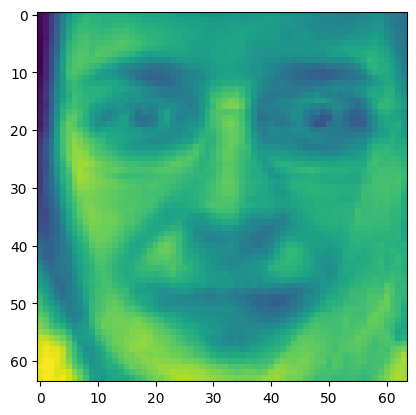

In [29]:
plt.imshow(U[:, 6].reshape(64, 64))

### Rozdielny nasich oproti priemernej tvary

In [30]:
face_diffs = dict()
for name, face in faces.items():
    face = cv2.blur(face,(5,5))
    face_vec = face.flatten()
    face_diffs[name] = face_vec - avg_face

### Vypocitaj koeficienty eigenfaces pre jednotlive tvare

In [31]:
%%time
face_vals = dict()
modes = [6, 7]
for name, face in face_diffs.items():
    val = (np.ravel(U[:, modes].T @ face))
    face_vals[name] = val

CPU times: total: 46.9 ms
Wall time: 24 ms


[-93.4718596 113.3832371]
[ 229.08233127 -246.29886055]
[ 367.64252672 -221.66403417]
[-1484.89589294    95.65999104]
[-44.08528742 116.36347762]
[ -5.03396839 168.13528512]
[-87.47300547 438.02125074]
[-183.50797341 -728.90138236]
[  -8.74183721 -572.33686841]
[-112.07359003  -75.30634728]
[ 206.75092896 -137.14595189]
[-419.97195073 -366.57911876]
[ -44.04278598 -449.19890976]
[-12.73210201  89.38742175]
[-157.04325864 -350.93175741]
[  302.48676467 -1009.44277571]
[333.85014856 170.67816209]
[-334.41940108 -299.23798427]
[ 73.00399749 399.20187525]
[ 26.93653854 -26.08529613]
[  77.93801056 -250.51348171]
[ 66.84594723 639.98013451]
[-604.26750636  142.75112332]
[-494.55036479 -588.1422739 ]
[-47.14449356 751.531053  ]
[412.16022252 -52.76408489]
[271.96658518 -18.1994895 ]
[-159.534608    154.88124964]
[78.19701269 21.7894702 ]
[ -66.15026696 -372.34436942]
[-147.98807397  -94.65605042]
[   1.18069731 -203.15449154]
[ 572.93839777 -711.56765277]
[-1058.98416752  -131.60295968]
[-13

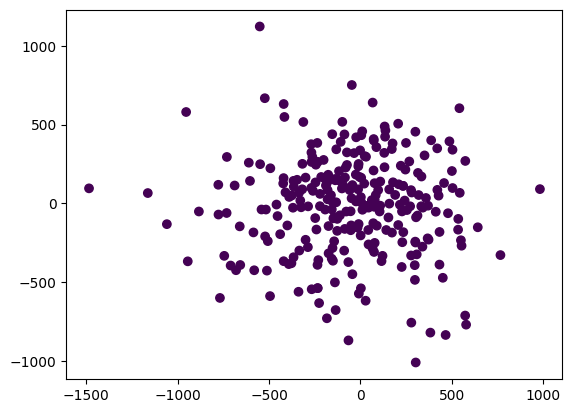

In [32]:
pca = []
names_clustering = []
c = []
for name1, val1 in face_vals.items():
    best_dist = float("inf")
    pca.append(val1)

    cc = int("" in name1 )
    c.append(cc)
    if cc:
        print(val1)

    names_clustering.append(name1)
    best_name = ""
    for name2, val2 in face_vals.items():
        if name1 != name2 and np.linalg.norm(val1 - val2) < best_dist:

            best_dist = np.linalg.norm(val1 - val2)
            best_name = name2
    #print("Najpodobnejsia tvar k", name1, "je", best_name, best_dist)
    #print(f"{name1:42} {best_name:42} {best_dist:1.18}")

pca = np.array(pca)
print(pca.shape)

plt.scatter(x=pca[:, 0], y=pca[:, 1], c=c)

In [33]:
names = []
vals = []
for name, face in face_vals.items():
    names.append(name)
    vals.append(face)

### Hľadanie lakťa na celych dátach

C:\Users\user2\Desktop\pridav\eigenfaces\venv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\user2\Desktop\pridav\eigenfaces\venv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\user2\Desktop\pridav\eigenfaces\venv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\user2\Desktop\pridav\eigenfaces\venv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

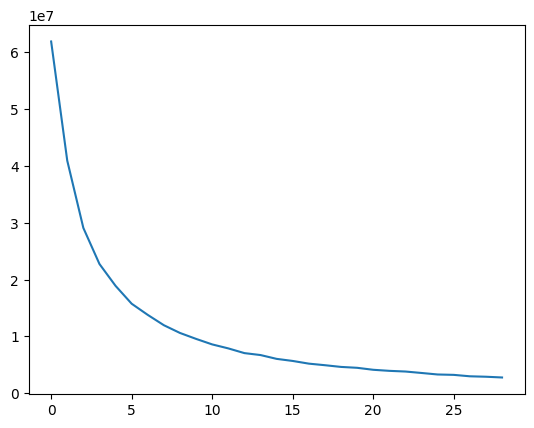

In [34]:
iner = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i, random_state=3, algorithm="lloyd").fit(vals)
    iner.append(kmeans.inertia_)

plt.plot(iner)

In [35]:
for name1, val1 in face_vals.items():
    best_dist = float("inf")
    best_name = ""
    for name2, val2 in face_vals.items(): 
        if name1 != name2 and np.linalg.norm(val1 - val2) < best_dist:
            best_dist = np.linalg.norm(val1 - val2)
            best_name = name2
    #print("Najpodobnejsia tvar k", name1, "je", best_name, best_dist)
    print(f"{name1:42} {best_name:42} {best_dist:1.18}")
            


AIN extra_Alexander Simko_align.jpg        KAFZM_Mario Janda PhD_align.jpg            20.0843306644926187
AIN extra_Andrej Lucny_align.jpg           KAFZM_Emil Puha_align.jpg                  64.2201800152813291
AIN extra_Barbora Cimrova_align.jpg        KAFZM_Zuzana Surova_align.jpg              9.66440506399687038
AIN extra_Damas Gruska_align.jpg           hip_hindicka6_align.jpg                    322.967400012935684
AIN extra_Dusan Guller_align.jpg           AIN_Jan Rybar_align.jpg                    34.9586661355295831
AIN extra_Frantisek Gyarfas_align.jpg      KEF_Miroslav Zahoran CSc_align.jpg         10.5127487940172504
AIN extra_Jan Komara_align.jpg             KJFB_Stanislav Tokar DrSc_align.jpg        51.6432107277922157
AIN extra_Lubica Benuskova_align.jpg       KTVS_raabova1-ktvs_align.jpg               70.8334796061458007
AIN extra_Maria Markosova_align.jpg        KDMFI_kubincova1_align.jpg                 35.5228244602142809
AIN extra_Martin Takac_align.jpg           MAT

C:\Users\user2\Desktop\pridav\eigenfaces\venv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


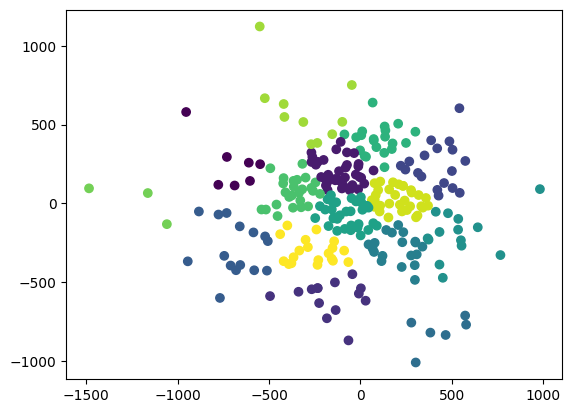

In [36]:
kmeans = KMeans(n_clusters=15, random_state=0, algorithm="lloyd").fit(pca)
plt.scatter(x=pca[:, 0], y=pca[:, 1], c=kmeans.labels_)

In [37]:
num_values = len(set(kmeans.labels_))

clustered = [[] for i in range(num_values)]

for cluster in range(len(kmeans.labels_)):

    clustered[kmeans.labels_[cluster]].append(names_clustering[cluster])

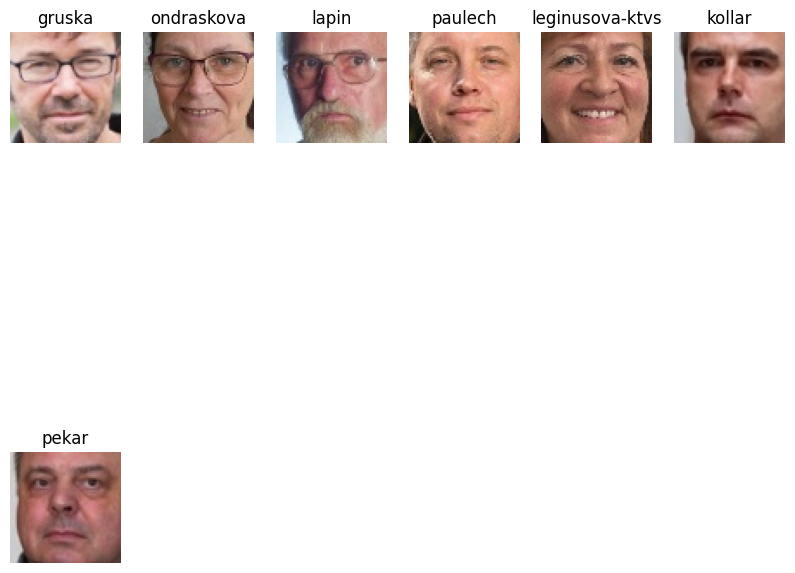

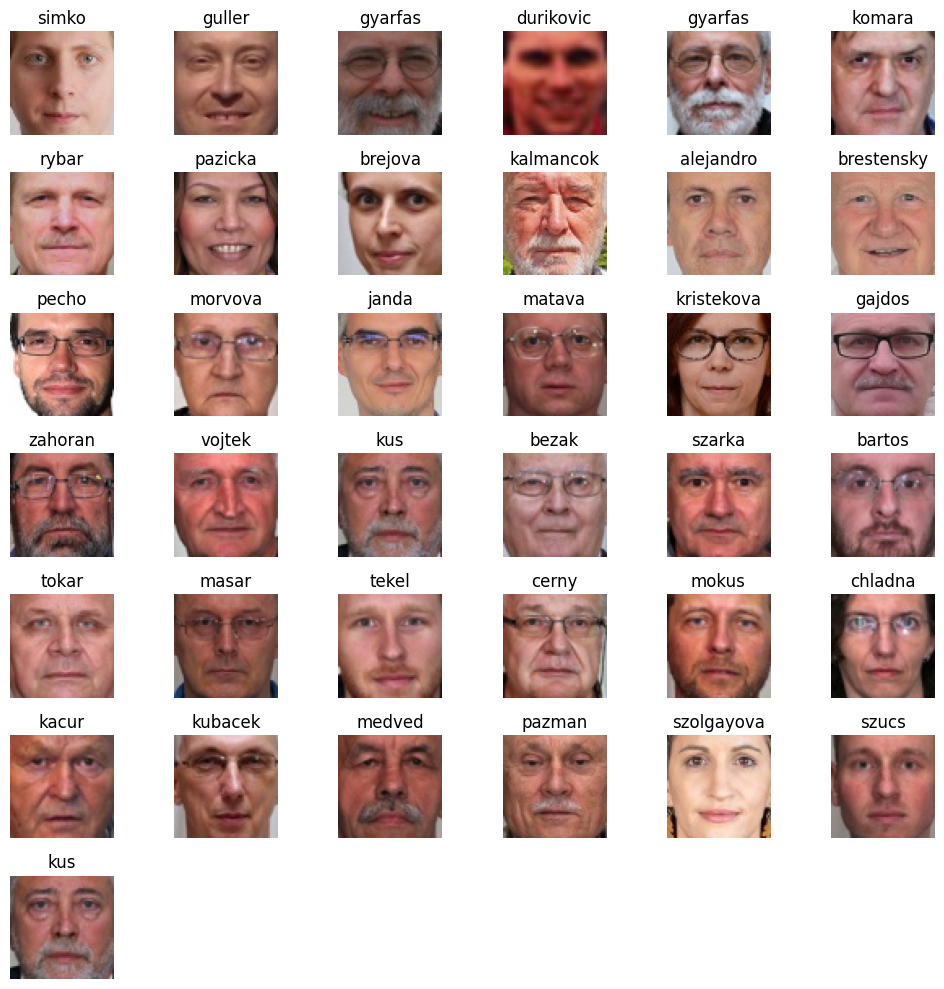

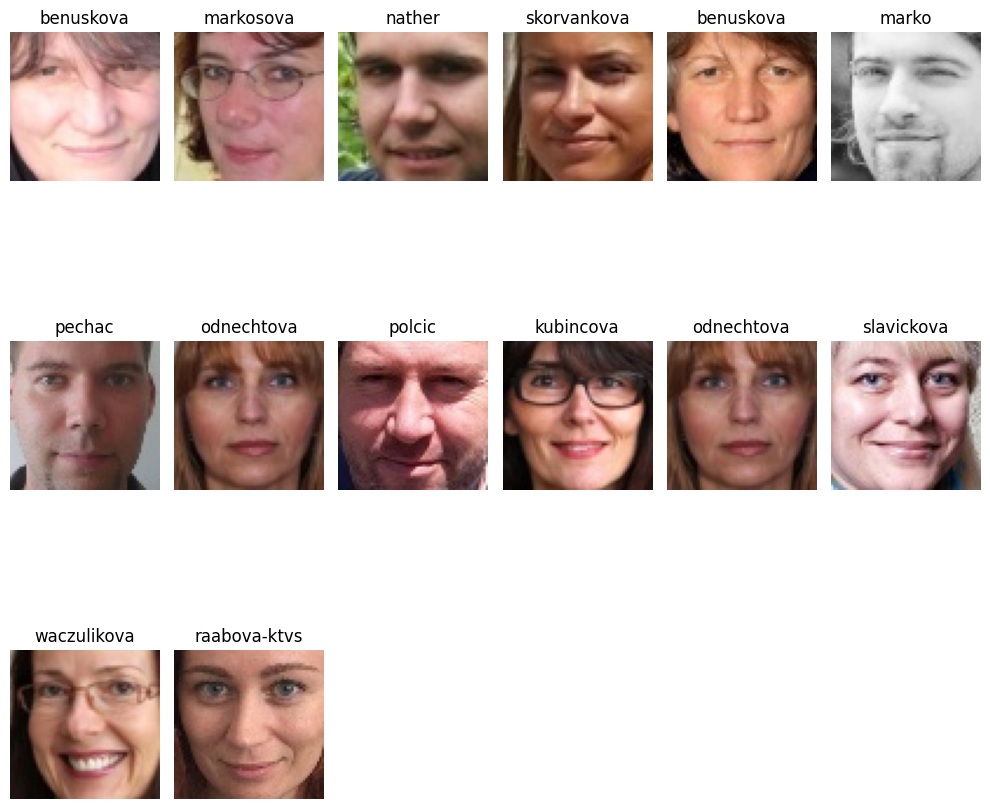

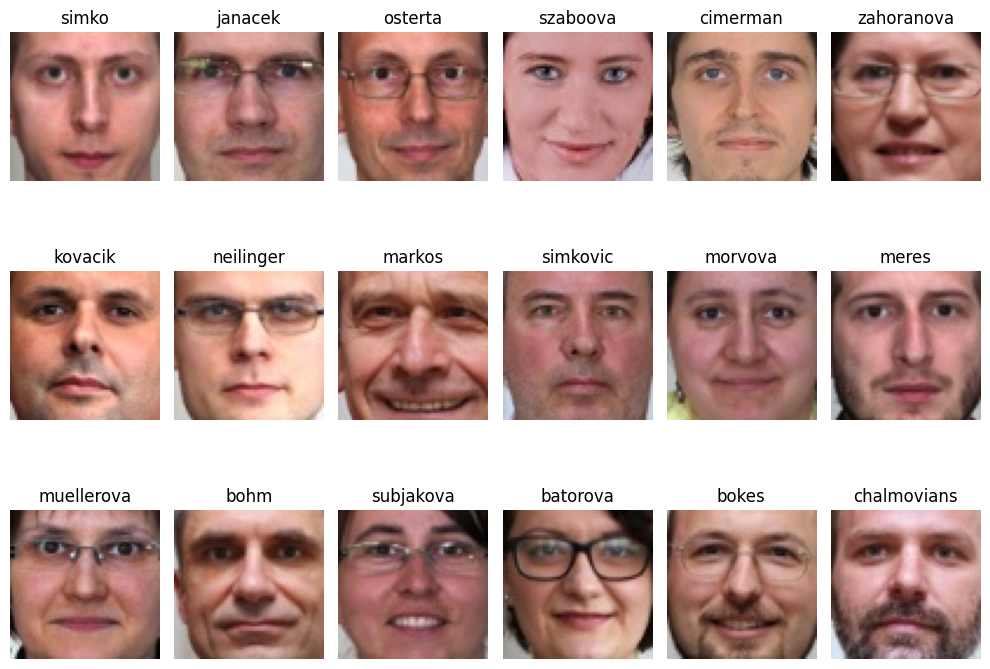

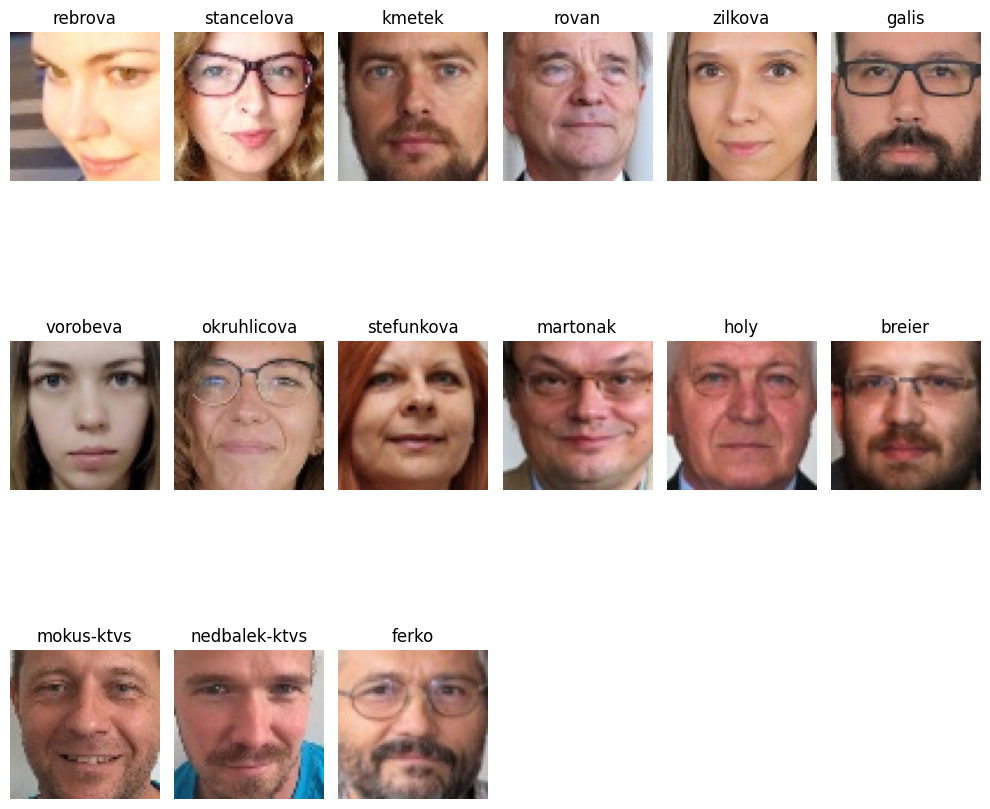

...

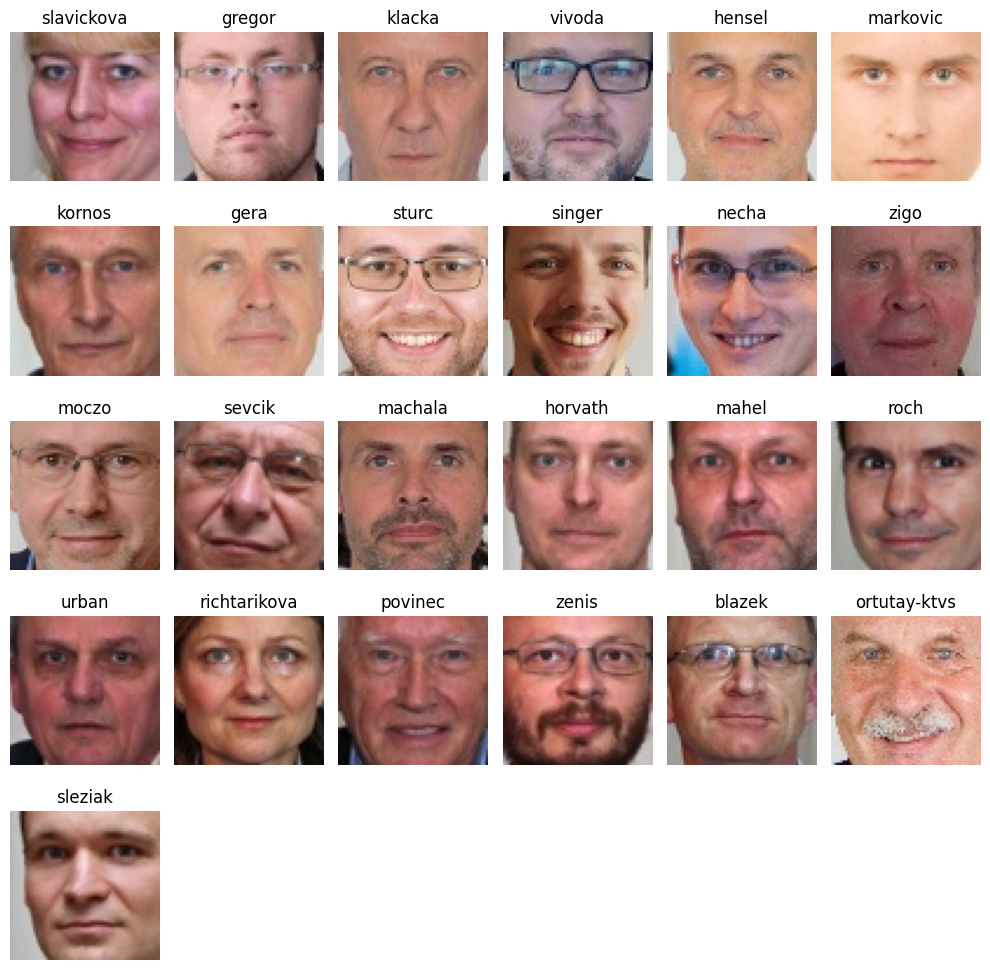

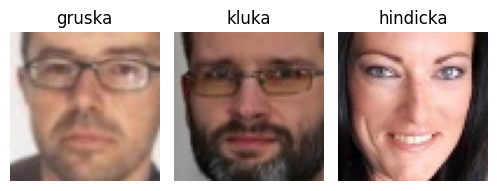

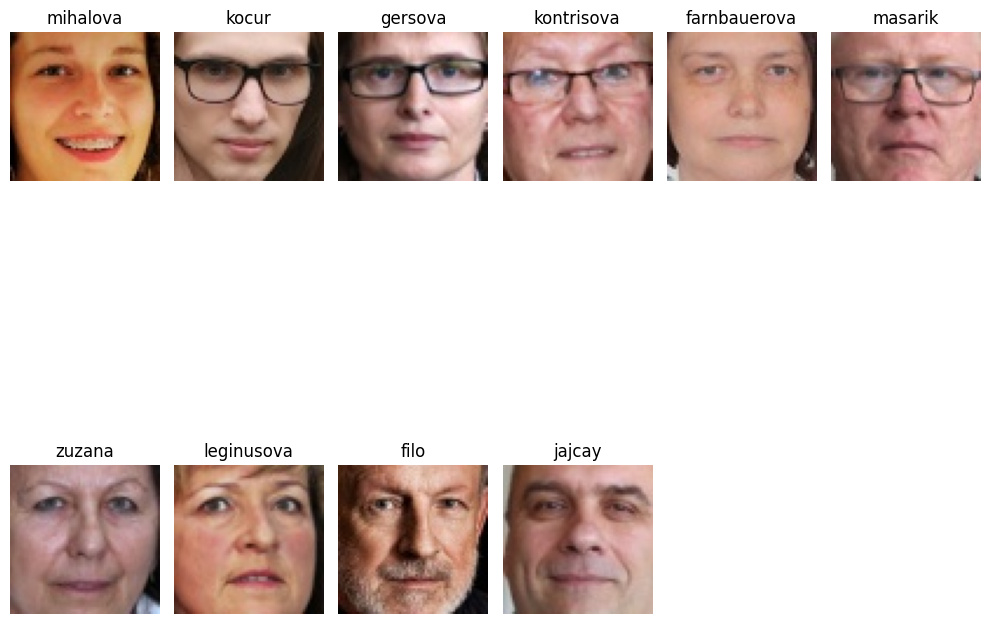

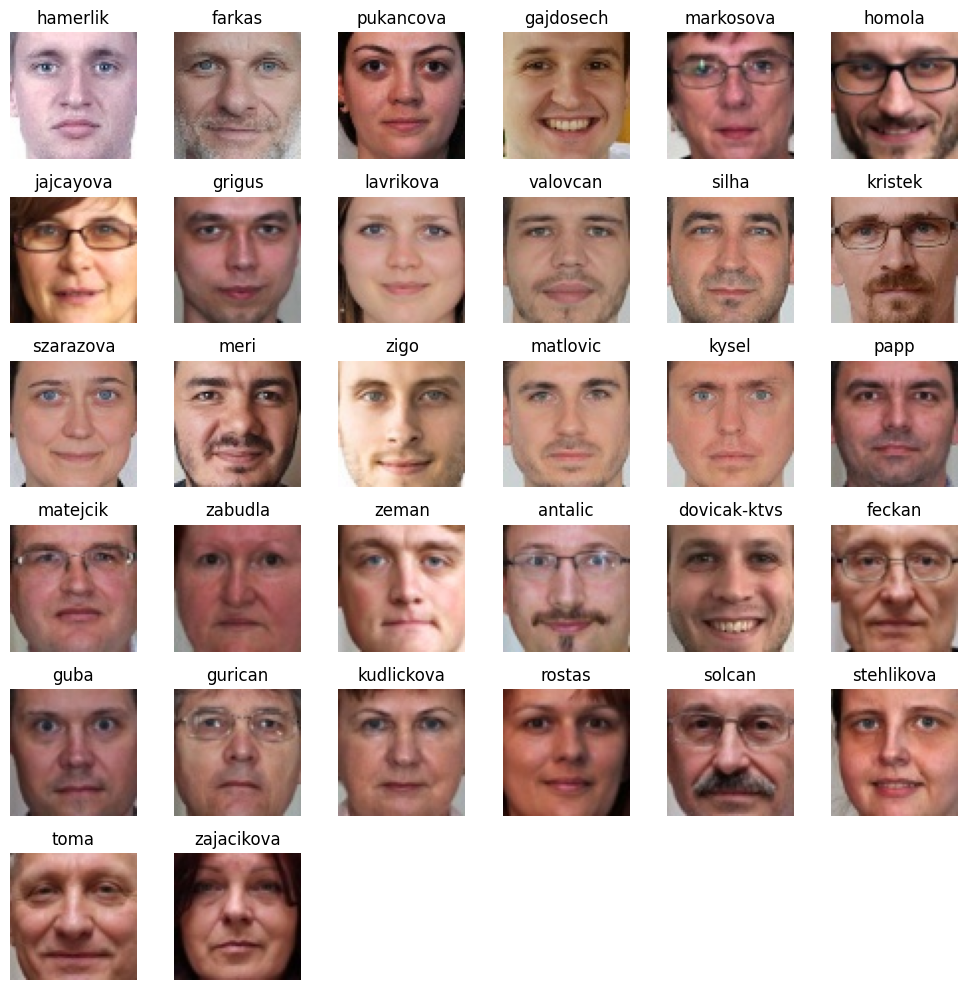

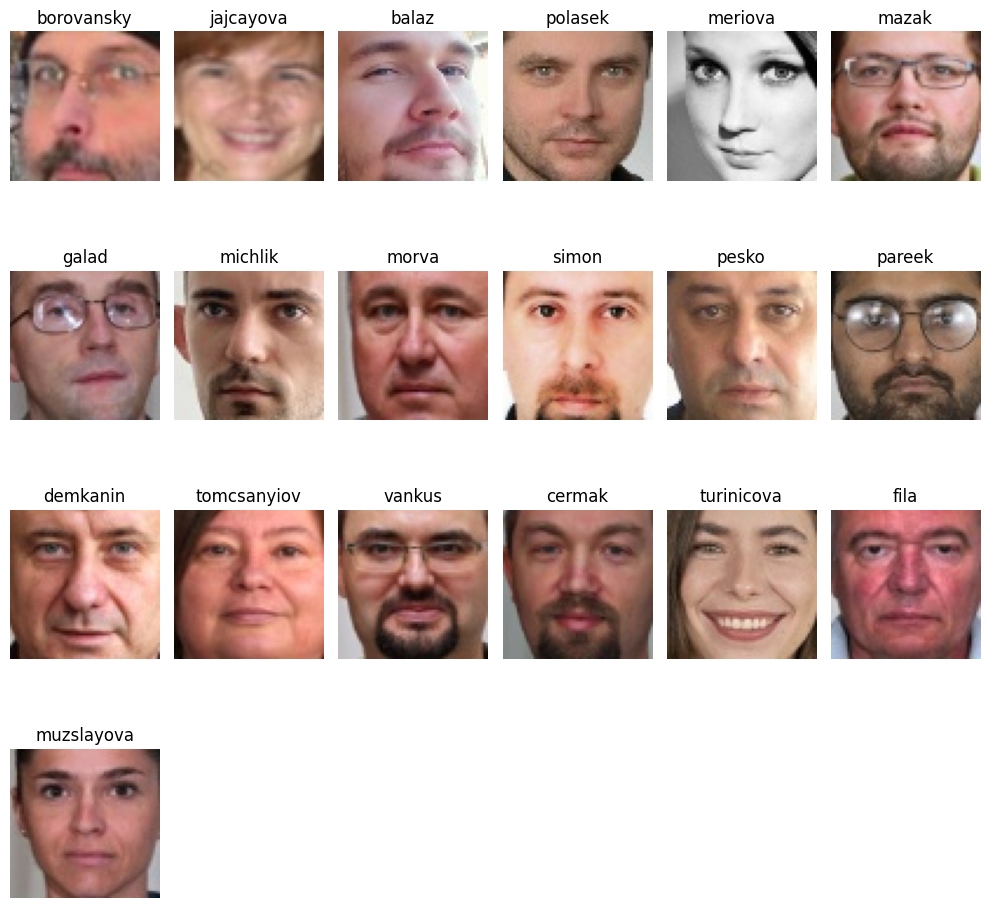

In [38]:
for cluster in clustered:

    fig = plt.figure(figsize=(10, 10))

    for j in range (len(cluster)):
        fig.add_subplot(int(len(cluster) / 6)+1, 6,j+1)
        plt.rcParams["figure.autolayout"] = True
        photo = cv2.imread("photos64/"+cluster[j])

        lastname = (cluster[j].split("_")[1]).split()

        if len(lastname) == 1:
            lastname = lastname[0].lower()
        else:
            lastname = lastname[1].lower()
        lastname = ''.join([k for k in lastname if not k.isdigit()])
        plt.axis('off')
        plt.title(lastname)

        rgb = cv2.cvtColor(photo, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb, cmap = plt.cm.Spectral)
    plt.show()